# Spatial Joining Parks and Arrests

#### Elise Chessman

**Guiding question for this notebook:** are different arrests happening near parks vs. all arrests in NYC for 2021?

I'll start by joining the entire arrest data from 2021 to the NYC parks GeoJson. I will explore using a 100m buffer to see how arrests in and around parks compare to the overall arrests distribution. This will help inform our predictive model of how proximity to/being within a park might skew the types of arrests happening. 

In [1]:
import pandas as pd
import geopandas as gpd
import requests
import json
import matplotlib.pyplot as plt


In [2]:
requestString = 'https://data.cityofnewyork.us/resource/4j29-i5ry.geojson'
parkgdf = gpd.read_file(requestString)
parkgdf


,propname,retireddate,zipcode,acres,location,nys_assembly,councildistrict,description,us_congress,gispropnum,retired,communityboard,department,subcategory,precinct,omppropid,sitename,nys_senate,borough,geometry
0,Devoe Park,None,10468,0.82058454,"University Ave & Fr Zeiser Pl, Near W 188 St",78,14,Devoe Park-Devoe Park,13,X013,False,207,X-05,Plgd Within Park,52,X013-01,Devoe Park,33,X,"MULTIPOLYGON (((-73.90516 40.86389, -73.90520 ..."
1,Brower Park,None,11213,0.80198644,Brooklyn Ave & Prospect Pl,43,36,Brower Park-Brower Park,9,B012,False,308,B-08,Plgd Within Park,77,B012-03,Brower Park,25,B,"MULTIPOLYGON (((-73.94305 40.67401, -73.94301 ..."
2,Sara D. Roosevelt Park,None,10002,0.78430157,Bet Grand & Hester Sts,65,1,Sara D Roosevelt Park-Hester St Playground,7,M105,False,103,M-03,Plgd Within Park,5,M105-08,Hester St Plgd,26,M,"MULTIPOLYGON (((-73.99418 40.71696, -73.99414 ..."
3,River Avenue Parks,None,10451,0.439,South Side Of E 157th St & River Ave,84,8,River Avenue Skate Park,15,X348,False,204,X-04,Neighborhood Plgd,44,X348-02,River Avenue Parks,29,X,"MULTIPOLYGON (((-73.92713 40.82561, -73.92735 ..."
4,Cooper Park,None,11211,0.52813527,"Sharon & Olive Sts, Morgan Ave",53,34,Cooper Park-Carnegie Playground,12,B025,False,301,B-01,Plgd Within Park,90,B025-01,Carnegie Plgd,18,B,"MULTIPOLYGON (((-73.93725 40.71592, -73.93718 ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
903,St. Nicholas Park,None,10031,7.70325311,135 To 141 Sts/St. Nicholas Ave To Upper Path,70,9,St Nicholas Park Zone 02,13,M077,False,109,M-09,Large Park Zone,26,M077-ZN02,St Nicholas Park Zone 02,30,M,"MULTIPOLYGON (((-73.94823 40.81731, -73.94819 ..."
904,St. Nicholas Park,None,10027,8.34828471,128 To 135 Sts/St. Nicholas Ave To Upper Path,70,9,St Nicholas Park Zone 01,13,M077,False,109,M-09,Large Park Zone,26,M077-ZN01,St Nicholas Park Zone 01,30,M,"MULTIPOLYGON (((-73.94911 40.81760, -73.94912 ..."
905,Highbridge Park,None,10032,8.783184350000001,"Edgecombe Av, approx W 163 to W 173 Sts (to pa...",72,10,Highbridge Park Zone 8,13,M037,False,112,M-12A,Large Park Zone,33,M037-ZN08,Highbridge Park Zone 8,31,M,"MULTIPOLYGON (((-73.93301 40.84194, -73.93312 ..."
906,Fort Greene Park,None,11201,5.59669217,Central Hill Including Monument And CS,57,35,Fort Greene Park Zone 3,8,B032,False,302,B-02,Large Park Zone,88,B032-ZN03,Fort Greene Park Zone 3,25,B,"MULTIPOLYGON (((-73.97592 40.69226, -73.97595 ..."


In [3]:
arrests = pd.read_pickle('../NYCParks-SAEC/results_df.pandas')

arrests = gpd.GeoDataFrame(arrests, 
                        geometry = gpd.points_from_xy(
                         arrests.longitude, 
                         arrests.latitude, crs='EPSG:4326'))

arrests


,arrest_key,arrest_date,pd_cd,pd_desc,ky_cd,ofns_desc,law_code,law_cat_cd,arrest_boro,arrest_precinct,...,y_coord_cd,latitude,longitude,geocoded_column,:@computed_region_f5dn_yrer,:@computed_region_yeji_bk3q,:@computed_region_92fq_4b7q,:@computed_region_sbqj_enih,:@computed_region_efsh_h5xi,geometry
0,238013474,2021-12-18T00:00:00.000,157,RAPE 1,104.0,RAPE,PL 1303501,F,Q,105,...,203954,40.72618713000002,-73.73523390399998,"{'type': 'Point', 'coordinates': [-73.73523390...",63,3,16,63,24337,POINT (-73.73523 40.72619)
1,236943583,2021-11-25T00:00:00.000,263,"ARSON 2,3,4",114.0,ARSON,PL 1501500,F,K,69,...,171320,40.63686750900007,-73.89158591899997,"{'type': 'Point', 'coordinates': [-73.89158591...",5,2,8,42,13827,POINT (-73.89159 40.63687)
2,234938876,2021-10-14T00:00:00.000,594,OBSCENITY 1,116.0,SEX CRIMES,PL 2631100,F,K,61,...,155739,40.59414516900005,-73.96041495199995,"{'type': 'Point', 'coordinates': [-73.96041495...",32,2,15,36,18183,POINT (-73.96041 40.59415)
3,234788259,2021-10-11T00:00:00.000,263,"ARSON 2,3,4",114.0,ARSON,PL 1501001,F,B,42,...,239616,40.82433953100008,-73.91036538099996,"{'type': 'Point', 'coordinates': [-73.91036538...",34,5,43,25,10929,POINT (-73.91037 40.82434)
4,234188790,2021-09-28T00:00:00.000,578,NaN,NaN,NaN,PL 2223001,M,B,44,...,246667,40.84370255600004,-73.92439508899997,"{'type': 'Point', 'coordinates': [-73.92439508...",50,5,42,27,10930,POINT (-73.92440 40.84370)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155502,222884924,2021-01-10T00:00:00.000,397,"ROBBERY,OPEN AREA UNCLASSIFIED",105.0,ROBBERY,PL 1601001,F,B,46,...,247605,40.846260031000035,-73.90175529499999,"{'type': 'Point', 'coordinates': [-73.90175529...",6,5,22,29,10935,POINT (-73.90176 40.84626)
155503,223918625,2021-02-03T00:00:00.000,792,WEAPONS POSSESSION 1 & 2,118.0,DANGEROUS WEAPONS,PL 2650303,F,K,67,...,180941,40.66330200400005,-73.92542497899994,"{'type': 'Point', 'coordinates': [-73.92542497...",61,2,17,40,17614,POINT (-73.92542 40.66330)
155504,224323770,2021-02-13T00:00:00.000,101,ASSAULT 3,344.0,ASSAULT 3 & RELATED OFFENSES,PL 1200001,M,S,121,...,166367,40.623226819000074,-74.14922697299994,"{'type': 'Point', 'coordinates': [-74.14922697...",4,1,13,75,10700,POINT (-74.14923 40.62323)
155505,222599533,2021-01-04T00:00:00.000,792,WEAPONS POSSESSION 1 & 2,118.0,DANGEROUS WEAPONS,PL 2650303,F,K,73,...,188555,40.684194302000044,-73.91608474599997,"{'type': 'Point', 'coordinates': [-73.91608474...",55,2,17,46,13516,POINT (-73.91608 40.68419)


In [4]:
# want to check out the timeframe for my arrests
print(arrests['arrest_date'].min())
print(arrests['arrest_date'].max())

#ok cool it's for all of 2021! 

2021-01-01T00:00:00.000
2021-12-31T00:00:00.000


Next, I'll use a spatial join with a nearest neighbor calculation to create a column for distance to a park for each arrest. I'll then create a boolean column for if the arrest is within 100m of a park. Then, I'll create a separate dataframe of arrests within 100m of a park to start to compare them. 

In [5]:
parkgdf.to_crs('EPSG:3497', inplace=True)
arrests.to_crs('EPSG:3497', inplace=True)

<AxesSubplot:>

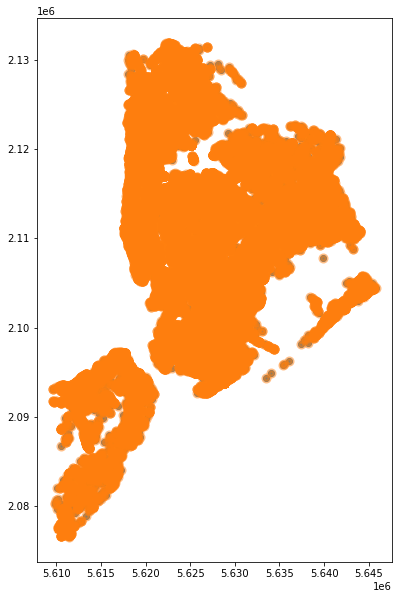

In [6]:
parkarrests = arrests.sjoin_nearest(parkgdf, distance_col='dist_to_park')
# use this join, don't need the centroid
fig, ax=plt.subplots(figsize=(10,10))
parkarrests.plot(ax=ax)
parkarrests.plot(ax=ax, lw=4, alpha=0.5)

In [7]:
parkarrests.dist_to_park.describe()
# are these units in meters? check projection documentation

count    155511.000000
mean        692.921785
std         514.692119
min           0.000000
25%         295.093349
50%         582.357932
75%         998.647467
max        4116.509794
Name: dist_to_park, dtype: float64

In [8]:
parkarrests['hundred_m']=parkarrests.dist_to_park<101
pd.set_option('display.max_columns', None)
parkarrests
parkarrests.to_pickle('parkarrests.pandas')

Once I have an idea of our potentially signficant arrests that are closer to or within a park, I'll start thinking about how to set up a predictive model to see if the arrrests 

## Arrests Descriptive Statistics

The 'ofns_desc' column is the "description of internal classification corresponding with KY code (more general category than PD description)", which will be more helpful for our purposes than the specifics used within the Police Department.

In [9]:
arrest_by_charge = parkarrests.ofns_desc.value_counts().reset_index()
arrest_by_charge

,index,ofns_desc
0,ASSAULT 3 & RELATED OFFENSES,26855
1,FELONY ASSAULT,15580
2,PETIT LARCENY,13178
3,DANGEROUS DRUGS,10450
4,MISCELLANEOUS PENAL LAW,10328
...,...,...
58,PARKING OFFENSES,3
59,FELONY SEX CRIMES,2
60,ADMINISTRATIVE CODES,2
61,KIDNAPPING AND RELATED OFFENSES,1


In [10]:
arrest_by_charge.columns=['charge','count']
arrest_by_charge

,charge,count
0,ASSAULT 3 & RELATED OFFENSES,26855
1,FELONY ASSAULT,15580
2,PETIT LARCENY,13178
3,DANGEROUS DRUGS,10450
4,MISCELLANEOUS PENAL LAW,10328
...,...,...
58,PARKING OFFENSES,3
59,FELONY SEX CRIMES,2
60,ADMINISTRATIVE CODES,2
61,KIDNAPPING AND RELATED OFFENSES,1


In [11]:
hundredmeterdf = parkarrests[parkarrests.hundred_m==True]
hundredmeterdf

,arrest_key,arrest_date,pd_cd,pd_desc,ky_cd,ofns_desc,law_code,law_cat_cd,arrest_boro,arrest_precinct,jurisdiction_code,age_group,perp_sex,perp_race,x_coord_cd,y_coord_cd,latitude,longitude,geocoded_column,:@computed_region_f5dn_yrer,:@computed_region_yeji_bk3q,:@computed_region_92fq_4b7q,:@computed_region_sbqj_enih,:@computed_region_efsh_h5xi,geometry,index_right,propname,retireddate,zipcode,acres,location,nys_assembly,councildistrict,description,us_congress,gispropnum,retired,communityboard,department,subcategory,precinct,omppropid,sitename,nys_senate,borough,dist_to_park,hundred_m
22524,234057760,2021-09-25T00:00:00.000,101,ASSAULT 3,344.0,ASSAULT 3 & RELATED OFFENSES,PL 1200001,M,Q,111,0,25-44,M,WHITE,1052607,204939,40.72893099600003,-73.75336780399994,"{'type': 'Point', 'coordinates': [-73.75336780...",26,3,16,69,24336,POINT (5638283.221 2117398.028),771,Grand Central Parkway,None,11427,12.95352546,"North Of Grand Central Pkwy, From Bell Blvd To...",24,23,Grand Central Parkway-Potamogeton Pond,6,Q084,False,411,Q-11,Large Park Zone,112,Q084-ZN01,Potamogeton Pond,14,Q,68.166447,True
8101,238331935,2021-12-27T00:00:00.000,109,"ASSAULT 2,1,UNCLASSIFIED",106.0,FELONY ASSAULT,PL 1201001,F,K,69,2,<18,F,BLACK,1016452,170415,40.63437605200004,-73.88398062199997,"{'type': 'Point', 'coordinates': [-73.88398062...",5,2,8,42,13827,POINT (5632729.080 2103120.481),816,Canarsie Park,None,11236,26.05383876,"Seaview Ave, Belt Pkwy, E 102 St, E 105 St: Ba...",59,46,Canarsie Park Zone 5,8,B018,False,318,B-18,Large Park Zone,69,B018-ZN05,Canarsie Park Zone 5,19,B,13.489873,True
12836,236160727,2021-11-11T00:00:00.000,792,WEAPONS POSSESSION 1 & 2,118.0,DANGEROUS WEAPONS,PL 265031B,F,K,69,0,18-24,M,BLACK,1016452,170415,40.63437605200004,-73.88398062199997,"{'type': 'Point', 'coordinates': [-73.88398062...",5,2,8,42,13827,POINT (5632729.080 2103120.481),816,Canarsie Park,None,11236,26.05383876,"Seaview Ave, Belt Pkwy, E 102 St, E 105 St: Ba...",59,46,Canarsie Park Zone 5,8,B018,False,318,B-18,Large Park Zone,69,B018-ZN05,Canarsie Park Zone 5,19,B,13.489873,True
13917,238384318,2021-12-29T00:00:00.000,203,"TRESPASS 3, CRIMINAL",352.0,CRIMINAL TRESPASS,PL 140100E,M,K,69,2,18-24,M,BLACK,1017221,170298,40.63405208300003,-73.881210561,"{'type': 'Point', 'coordinates': [-73.88121056...",33,2,8,42,13827,POINT (5632957.711 2103187.856),816,Canarsie Park,None,11236,26.05383876,"Seaview Ave, Belt Pkwy, E 102 St, E 105 St: Ba...",59,46,Canarsie Park Zone 5,8,B018,False,318,B-18,Large Park Zone,69,B018-ZN05,Canarsie Park Zone 5,19,B,42.209344,True
18143,238333522,2021-12-27T00:00:00.000,109,"ASSAULT 2,1,UNCLASSIFIED",106.0,FELONY ASSAULT,PL 1201001,F,K,69,0,18-24,F,BLACK,1016452,170415,40.63437605200004,-73.88398062199997,"{'type': 'Point', 'coordinates': [-73.88398062...",5,2,8,42,13827,POINT (5632729.080 2103120.481),816,Canarsie Park,None,11236,26.05383876,"Seaview Ave, Belt Pkwy, E 102 St, E 105 St: Ba...",59,46,Canarsie Park Zone 5,8,B018,False,318,B-18,Large Park Zone,69,B018-ZN05,Canarsie Park Zone 5,19,B,13.489873,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126092,225359770,2021-03-09T00:00:00.000,115,RECKLESS ENDANGERMENT 2,355.0,OFFENSES AGAINST THE PERSON,PL 1202000,M,B,45,0,18-24,M,BLACK HISPANIC,1039267,254707,40.86562329900005,-73.80109091499997,"{'type': 'Point', 'coordinates': [-73.80109091...",44,5,12,28,11273,POINT (5628117.299 2129484.636),135,Pelham Bay Park,None,10464,10.29563785,(n) Kanoe Kayak Launch To (s) Orchard Beach Rd.,82,13,Pelham Bay Park-The Lagoon,14,X039,False,228,X-15A,Flagship Park Zone,45,X039-ZN12,The Lagoon,34,X,7.191176,True
128810,225426622,2021-03-10T00:00:00.000,792,WEAPONS POSSESSION 1 & 2,118.0,DANGEROUS WEAPONS,PL 265031B,F,K,71,0,18-24,M,BLACK,1004101,182536,40.66768184600004,-73.92844443099993,"{'type': 'Point', 'coordinates': [-73.92844443...",17,2,17,44,1761

In [12]:
close_arrest_by_charge = hundredmeterdf.ofns_desc.value_counts().reset_index()
close_arrest_by_charge

,index,ofns_desc
0,ASSAULT 3 & RELATED OFFENSES,2045
1,FELONY ASSAULT,1146
2,DANGEROUS DRUGS,941
3,PETIT LARCENY,887
4,CRIMINAL MISCHIEF & RELATED OF,747
5,MISCELLANEOUS PENAL LAW,675
6,DANGEROUS WEAPONS,642
7,VEHICLE AND TRAFFIC LAWS,629
8,ROBBERY,599
9,GRAND LARCENY,533


In [13]:
close_arrest_by_charge.columns=['charge','count']
close_arrest_by_charge

,charge,count
0,ASSAULT 3 & RELATED OFFENSES,2045
1,FELONY ASSAULT,1146
2,DANGEROUS DRUGS,941
3,PETIT LARCENY,887
4,CRIMINAL MISCHIEF & RELATED OF,747
5,MISCELLANEOUS PENAL LAW,675
6,DANGEROUS WEAPONS,642
7,VEHICLE AND TRAFFIC LAWS,629
8,ROBBERY,599
9,GRAND LARCENY,533


In [14]:
chargecompare = arrest_by_charge.merge(close_arrest_by_charge, on = 'charge', suffixes = ('_all','_parks'))
chargecompare
chargecompare['all_percent']=(chargecompare['count_all']/chargecompare['count_all'].sum())*100
chargecompare['park_percent']=(chargecompare['count_parks']/chargecompare['count_parks'].sum())*100
chargecompare

,charge,count_all,count_parks,all_percent,park_percent
0,ASSAULT 3 & RELATED OFFENSES,26855,2045,17.295233,16.445517
1,FELONY ASSAULT,15580,1146,10.033876,9.215923
2,PETIT LARCENY,13178,887,8.486933,7.133092
3,DANGEROUS DRUGS,10450,941,6.730039,7.567350
4,MISCELLANEOUS PENAL LAW,10328,675,6.651468,5.428227
5,CRIMINAL MISCHIEF & RELATED OF,9294,747,5.985548,6.007238
6,ROBBERY,7848,599,5.054291,4.817049
7,DANGEROUS WEAPONS,7207,642,4.641472,5.162847
8,GRAND LARCENY,6671,533,4.296276,4.286289
9,VEHICLE AND TRAFFIC LAWS,5264,629,3.390136,5.058303


So from these percentage breakdowns (and from the visualizations produced later in this notebook) it seems as if there are very few major differences in the type of arrests that happen around parks vs. arrests overall. I do think that a higher percentage of dangerous drug arrests could be interesting to explore, but first I'll see if looking at the crime category makes a difference. I used [this list](https://www.denvergov.org/media/gis/DataCatalog/crime/pdf/NIBRS_Crime_Types.pdf) to base this grouping and compare if there's a more substantial difference between crime group breakdowns near parks. 

In [15]:
arrest_by_charge['charge'].tolist()

['ASSAULT 3 & RELATED OFFENSES',
 'FELONY ASSAULT',
 'PETIT LARCENY',
 'DANGEROUS DRUGS',
 'MISCELLANEOUS PENAL LAW',
 'CRIMINAL MISCHIEF & RELATED OF',
 'ROBBERY',
 'DANGEROUS WEAPONS',
 'GRAND LARCENY',
 'VEHICLE AND TRAFFIC LAWS',
 'BURGLARY',
 'OFFENSES AGAINST PUBLIC ADMINI',
 'OFFENSES INVOLVING FRAUD',
 'SEX CRIMES',
 'OFF. AGNST PUB ORD SENSBLTY &',
 'FORGERY',
 'INTOXICATED & IMPAIRED DRIVING',
 'POSSESSION OF STOLEN PROPERTY',
 'OTHER TRAFFIC INFRACTION',
 'MURDER & NON-NEGL. MANSLAUGHTE',
 'FOR OTHER AUTHORITIES',
 'OTHER OFFENSES RELATED TO THEF',
 'CRIMINAL TRESPASS',
 'GRAND LARCENY OF MOTOR VEHICLE',
 'OFFENSES AGAINST THE PERSON',
 'NYS LAWS-UNCLASSIFIED FELONY',
 'OTHER STATE LAWS (NON PENAL LA',
 'RAPE',
 'UNAUTHORIZED USE OF A VEHICLE',
 "BURGLAR'S TOOLS",
 'INTOXICATED/IMPAIRED DRIVING',
 'FRAUDS',
 'ALCOHOLIC BEVERAGE CONTROL LAW',
 'GAMBLING',
 'PROSTITUTION & RELATED OFFENSES',
 'THEFT-FRAUD',
 'THEFT OF SERVICES',
 'OTHER STATE LAWS',
 'ARSON',
 'ADMINISTRATIVE 

In [16]:
charges = ['ASSAULT 3 & RELATED OFFENSES',
 'FELONY ASSAULT',
 'PETIT LARCENY',
 'DANGEROUS DRUGS',
 'MISCELLANEOUS PENAL LAW',
 'CRIMINAL MISCHIEF & RELATED OF',
 'ROBBERY',
 'DANGEROUS WEAPONS',
 'GRAND LARCENY',
 'VEHICLE AND TRAFFIC LAWS',
 'BURGLARY',
 'OFFENSES AGAINST PUBLIC ADMINI',
 'OFFENSES INVOLVING FRAUD',
 'SEX CRIMES',
 'OFF. AGNST PUB ORD SENSBLTY &',
 'FORGERY',
 'INTOXICATED & IMPAIRED DRIVING',
 'POSSESSION OF STOLEN PROPERTY',
 'OTHER TRAFFIC INFRACTION',
 'MURDER & NON-NEGL. MANSLAUGHTE',
 'FOR OTHER AUTHORITIES',
 'OTHER OFFENSES RELATED TO THEF',
 'CRIMINAL TRESPASS',
 'GRAND LARCENY OF MOTOR VEHICLE',
 'OFFENSES AGAINST THE PERSON',
 'NYS LAWS-UNCLASSIFIED FELONY',
 'OTHER STATE LAWS (NON PENAL LA',
 'RAPE',
 'UNAUTHORIZED USE OF A VEHICLE',
 "BURGLAR'S TOOLS",
 'INTOXICATED/IMPAIRED DRIVING',
 'FRAUDS',
 'ALCOHOLIC BEVERAGE CONTROL LAW',
 'GAMBLING',
 'PROSTITUTION & RELATED OFFENSES',
 'THEFT-FRAUD',
 'THEFT OF SERVICES',
 'OTHER STATE LAWS',
 'ARSON',
 'ADMINISTRATIVE CODE',
 'KIDNAPPING & RELATED OFFENSES',
 'OFFENSES AGAINST PUBLIC SAFETY',
 'AGRICULTURE & MRKTS LAW-UNCLASSIFIED',
 'ANTICIPATORY OFFENSES',
 'HARRASSMENT 2',
 'ENDAN WELFARE INCOMP',
 'FRAUDULENT ACCOSTING',
 'MOVING INFRACTIONS',
 'DISORDERLY CONDUCT',
 'CHILD ABANDONMENT/NON SUPPORT',
 'HOMICIDE-NEGLIGENT,UNCLASSIFIE',
 'OTHER STATE LAWS (NON PENAL LAW)',
 'OFFENSES RELATED TO CHILDREN',
 'KIDNAPPING',
 'JOSTLING',
 'HOMICIDE-NEGLIGENT-VEHICLE',
 'ESCAPE 3',
 'LOITERING/GAMBLING (CARDS, DIC',
 'PARKING OFFENSES',
 'FELONY SEX CRIMES',
 'ADMINISTRATIVE CODES',
 'KIDNAPPING AND RELATED OFFENSES',
 'NEW YORK CITY HEALTH CODE']

In [17]:
chargecompare.charge.to_list()

['ASSAULT 3 & RELATED OFFENSES',
 'FELONY ASSAULT',
 'PETIT LARCENY',
 'DANGEROUS DRUGS',
 'MISCELLANEOUS PENAL LAW',
 'CRIMINAL MISCHIEF & RELATED OF',
 'ROBBERY',
 'DANGEROUS WEAPONS',
 'GRAND LARCENY',
 'VEHICLE AND TRAFFIC LAWS',
 'BURGLARY',
 'OFFENSES AGAINST PUBLIC ADMINI',
 'OFFENSES INVOLVING FRAUD',
 'SEX CRIMES',
 'OFF. AGNST PUB ORD SENSBLTY &',
 'FORGERY',
 'INTOXICATED & IMPAIRED DRIVING',
 'POSSESSION OF STOLEN PROPERTY',
 'OTHER TRAFFIC INFRACTION',
 'MURDER & NON-NEGL. MANSLAUGHTE',
 'FOR OTHER AUTHORITIES',
 'OTHER OFFENSES RELATED TO THEF',
 'CRIMINAL TRESPASS',
 'GRAND LARCENY OF MOTOR VEHICLE',
 'OFFENSES AGAINST THE PERSON',
 'NYS LAWS-UNCLASSIFIED FELONY',
 'OTHER STATE LAWS (NON PENAL LA',
 'RAPE',
 'UNAUTHORIZED USE OF A VEHICLE',
 "BURGLAR'S TOOLS",
 'INTOXICATED/IMPAIRED DRIVING',
 'FRAUDS',
 'ALCOHOLIC BEVERAGE CONTROL LAW',
 'GAMBLING',
 'PROSTITUTION & RELATED OFFENSES',
 'THEFT-FRAUD',
 'THEFT OF SERVICES',
 'OTHER STATE LAWS',
 'ARSON',
 'ADMINISTRATIVE 

In [18]:
NIBRS_list= ['cr_persons', 'cr_property', 'cr_society','all_other','traffic']

In [19]:
chargecompare['NIBRS_cat']=['cr_persons',
 'cr_persons',
 'cr_property',
 'cr_society',
 'all_other',
 'cr_property',
 'cr_property',
 'cr_society',
 'cr_property',
 'traffic',
 'cr_property',
 'cr_persons',
 'cr_property',
 'cr_persons',
 'all_other',
 'cr_property',
 'traffic',
 'cr_property',
 'traffic',
 'cr_persons',
 'all_other',
 'cr_property',
 'all_other',
 'cr_property',
 'cr_persons',
 'all_other',
 'all_other',
 'cr_persons',
 'cr_property',
 "cr_property",
 'traffic',
 'cr_property',
 'all_other',
 'cr_society',
 'cr_society',
 'cr_property',
 'cr_property',
 'all_other',
 'cr_property',
 'all_other',
 'cr_persons',
 'cr_society',
 'all_other',
 'all_other',
 'all_other',
 'cr_persons',
 'traffic',
 'all_other',
 'all_other',
 'cr_persons',
 'cr_persons']

In [20]:
chargecompare

,charge,count_all,count_parks,all_percent,park_percent,NIBRS_cat
0,ASSAULT 3 & RELATED OFFENSES,26855,2045,17.295233,16.445517,cr_persons
1,FELONY ASSAULT,15580,1146,10.033876,9.215923,cr_persons
2,PETIT LARCENY,13178,887,8.486933,7.133092,cr_property
3,DANGEROUS DRUGS,10450,941,6.730039,7.567350,cr_society
4,MISCELLANEOUS PENAL LAW,10328,675,6.651468,5.428227,all_other
5,CRIMINAL MISCHIEF & RELATED OF,9294,747,5.985548,6.007238,cr_property
6,ROBBERY,7848,599,5.054291,4.817049,cr_property
7,DANGEROUS WEAPONS,7207,642,4.641472,5.162847,cr_society
8,GRAND LARCENY,6671,533,4.296276,4.286289,cr_property
9,VEHICLE AND TRAFFIC LAWS,5264,629,3.390136,5.058303,traffic


In [21]:

cr_persons = ['ASSAULT 3 & RELATED OFFENSES','FELONY ASSAULT','SEX CRIMES','OFFENSES AGAINST PUBLIC ADMINI', 'MURDER & NON-NEGL. MANSLAUGHTE','OFFENSES AGAINST THE PERSON','RAPE','KIDNAPPING & RELATED OFFENSES','FELONY SEX CRIMES','HOMICIDE-NEGLIGENT,UNCLASSIFIE','KIDNAPPING','KIDNAPPING AND RELATED OFFENSES', 'HOMICIDE-NEGLIGENT-VEHICLE', 'OFFENSES RELATED TO CHILDREN','ENDAN WELFARE INCOMP']
cr_property = ['PETIT LARCENY','ROBBERY','GRAND LARCENY','BURGLARY','OFFENSES INVOLVING FRAUD','CRIMINAL MISCHIEF & RELATED OF','FORGERY', 'POSSESSION OF STOLEN PROPERTY', 'OTHER OFFENSES RELATED TO THEF','GRAND LARCENY OF MOTOR VEHICLE','FRAUDS','THEFT-FRAUD','THEFT OF SERVICES','ARSON','UNAUTHORIZED USE OF A VEHICLE','FRAUDULENT ACCOSTING',"BURGLAR'S TOOLS"]
cr_society = ['DANGEROUS DRUGS','DANGEROUS WEAPONS', 'GAMBLING','PROSTITUTION & RELATED OFFENSES','OFFENSES AGAINST PUBLIC SAFETY','LOITERING/GAMBLING (CARDS, DIC']
all_other = ['MISCELLANEOUS PENAL LAW','OFF. AGNST PUB ORD SENSBLTY &','NYS LAWS-UNCLASSIFIED FELONY','ALCOHOLIC BEVERAGE CONTROL LAW','OTHER STATE LAWS','CRIMINAL TRESPASS','OTHER STATE LAWS (NON PENAL LA','HARRASSMENT 2','DISORDERLY CONDUCT','OTHER STATE LAWS (NON PENAL LAW)','FOR OTHER AUTHORITIES', 'ADMINISTRATIVE CODES','ADMINISTRATIVE CODE','AGRICULTURE & MRKTS LAW-UNCLASSIFIED','ANTICIPATORY OFFENSES', 'NEW YORK CITY HEALTH CODE', 'ESCAPE 3', 'JOSTLING','CHILD ABANDONMENT/NON SUPPORT']
traffic = ['VEHICLE AND TRAFFIC LAWS','INTOXICATED & IMPAIRED DRIVING','OTHER TRAFFIC INFRACTION','INTOXICATED/IMPAIRED DRIVING','MOVING INFRACTIONS', 'PARKING OFFENSES',]

In [22]:
chargecompare_cats = chargecompare.groupby(['NIBRS_cat']).sum()[['count_all','count_parks']]
chargecompare_cats

,count_all,count_parks
NIBRS_cat,,
all_other,18496,1420
cr_persons,53868,3853
cr_property,55001,4434
cr_society,18261,1620
traffic,9648,1108


In [23]:
chargecompare_cats['all_percent']=(chargecompare_cats['count_all']/chargecompare_cats['count_all'].sum())*100
chargecompare_cats['park_percent']=(chargecompare_cats['count_parks']/chargecompare_cats['count_parks'].sum())*100
chargecompare_cats

,count_all,count_parks,all_percent,park_percent
NIBRS_cat,,,,
all_other,18496,1420,11.911846,11.419381
cr_persons,53868,3853,34.692221,30.985123
cr_property,55001,4434,35.421899,35.657419
cr_society,18261,1620,11.760501,13.027744
traffic,9648,1108,6.213532,8.910334


It still seems as though the percentages are pretty similar for arrests and NIBRS categories across both datasets, and the proximity to a park is not influential enough to move forward with this question alone. I created some bar charts below to visualize those comparisons.

## Visualizations: All NYC 2021 Arrests

In [24]:
import pandas as pd
import plotly
import plotly.express as px

fig = px.bar(arrest_by_charge.head(20),
       x='charge',
       y='count',
       title='NYPD Arrests by Charge Type (2021)')

fig.show()

In [25]:
parkarrests_grouped=parkarrests.groupby(['hundred_m','ofns_desc', 'perp_sex','perp_race']).count()[['arrest_key']]
parkarrests_grouped.head(50)

arrest_key
hundred_m ofns_desc                            perp_sex perp_race                                 
False     ADMINISTRATIVE CODE                  F        ASIAN / PACIFIC ISLANDER                 2
                                                        BLACK                                    2
                                                        UNKNOWN                                  1
                                                        WHITE HISPANIC                           5
                                               M        ASIAN / PACIFIC ISLANDER                 6
                                                        BLACK                                   26
                                                        BLACK HISPANIC                           6
                                                        WHITE                                   11
                                                        WHITE HISPANIC                          20
          ADMINISTRATIVE CODES                 M        BLACK                                    1
                                                        WHITE                                    1
          AGRICULTURE & MRKTS LAW-UNCLASSIFIED F        ASIAN / PACIFIC ISLANDER                 2
                                                        BLACK                                   13
                                                        BLACK HISPANIC                           1
                                                        WHITE                                    3
                                                        WHITE HISPANIC                           8
                                               M        AMERICAN INDIAN/ALASKAN NATIVE           1
                                                        ASIAN / PACIFIC ISLANDER                 2
                                                        BLACK                                   24
                                                        BLACK HISPANIC                           3
                                                        WHITE                                    3
                                                        WHITE HISPANIC                           8
          ALCOHOLIC BEVERAGE CONTROL LAW       F        ASIAN / PACIFIC ISLANDER                 9
                                                        BLACK                                   44
                                                        BLACK HISPANIC                           7
                                                        UNKNOWN                                  1
                                                        WHITE                                    3
                                                        WHITE HISPANIC                          33
                                               M        AMERICAN INDIAN/ALASKAN NATIVE           1
                                                        ASIAN / PACIFIC ISLANDER                12
                                                        BLACK                                   93
                                                        BLACK HISPANIC                          28
                                                        UNKNOWN                                  2
                                                        WHITE                                   11
                                                        WHITE HISPANIC                          57
          ANTICIPATORY OFFENSES                F        BLACK                                    5
                                                        BLACK HISPANIC                           2
                                                        WHITE                                    2
                                                        WHITE HISPANIC                           2
                             

In [26]:
parkarrests_flat = parkarrests_grouped.reset_index()
parkarrests_flat

parkarrests_flat = parkarrests_flat.rename(columns={'arrest_key':'count', 'ofns_desc':'arrest description'})
parkarrests_flat

,hundred_m,arrest description,perp_sex,perp_race,count
0,False,ADMINISTRATIVE CODE,F,ASIAN / PACIFIC ISLANDER,2
1,False,ADMINISTRATIVE CODE,F,BLACK,2
2,False,ADMINISTRATIVE CODE,F,UNKNOWN,1
3,False,ADMINISTRATIVE CODE,F,WHITE HISPANIC,5
4,False,ADMINISTRATIVE CODE,M,ASIAN / PACIFIC ISLANDER,6
...,...,...,...,...,...
984,True,VEHICLE AND TRAFFIC LAWS,M,BLACK,261
985,True,VEHICLE AND TRAFFIC LAWS,M,BLACK HISPANIC,70
986,True,VEHICLE AND TRAFFIC LAWS,M,UNKNOWN,4
987,True,VEHICLE AND TRAFFIC LAWS,M,WHITE,64


In [27]:
fig = px.bar(parkarrests_flat,
       x='arrest description',
       y='count',
)

fig.show()

In [28]:
fig = px.bar(parkarrests_flat,
       x='arrest description',
       y='count',
       color='hundred_m' 
)

fig.show()

This is interesting, because it appears that most of our arrests are not happening within the parks. It looks like it might be a similar distribution of arrests though, so I will create a df to look just at the ones within 100m. 

We'll also want to see if there's a difference in the race/sex breakdown of park adjacent arrests and the total arrests, so let's look at those as well: 

In [29]:
fig = px.bar(parkarrests_flat,
       x='arrest description',
       y='count',
       color='perp_race' 
)

fig.show()

In [30]:
fig = px.bar(parkarrests_flat,
       x='arrest description',
       y='count',
       color='perp_sex'
)

fig.show()

## Visualizations Continued: Arrests within 100m of a Park

In [31]:
import pandas as pd

import plotly
import plotly.express as px

fig = px.bar(close_arrest_by_charge.head(20),
       x='charge',
       y='count',
       title='NYPD Arrests by Charge Type Within 100m of a Park (2021)')

fig.show()

That's not ideal... this distribution looks almost the exact same as our original one.

In [32]:
hundredmeterdf_grouped=hundredmeterdf.groupby(['ofns_desc', 'perp_sex','perp_race']).count()[['arrest_key']]
hundredmeterdf_grouped.head(50)

arrest_key
ofns_desc                            perp_sex perp_race                                 
ADMINISTRATIVE CODE                  M        ASIAN / PACIFIC ISLANDER                 1
                                              BLACK                                    3
                                              BLACK HISPANIC                           1
                                              WHITE                                    1
                                              WHITE HISPANIC                           1
AGRICULTURE & MRKTS LAW-UNCLASSIFIED F        BLACK                                    1
                                              WHITE                                    1
                                     M        BLACK                                    1
                                              WHITE                                    1
ALCOHOLIC BEVERAGE CONTROL LAW       F        BLACK HISPANIC                           3
                                              WHITE HISPANIC                           2
                                     M        ASIAN / PACIFIC ISLANDER                 1
                                              BLACK                                    1
                                              BLACK HISPANIC                           2
                                              WHITE HISPANIC                           3
ANTICIPATORY OFFENSES                F        BLACK                                    1
                                              WHITE HISPANIC                           1
                                     M        BLACK                                    4
                                              WHITE HISPANIC                           3
ARSON                                F        BLACK                                    1
                                              WHITE HISPANIC                           1
                                     M        BLACK                                    6
                                              UNKNOWN                                  1
                                              WHITE                                    3
                                              WHITE HISPANIC                           4
ASSAULT 3 & RELATED OFFENSES         F        AMERICAN INDIAN/ALASKAN NATIVE           1
                                              ASIAN / PACIFIC ISLANDER                 8
                                              BLACK                                  245
                                              BLACK HISPANIC                          63
                                              UNKNOWN                                  1
                                              WHITE                                   39
                                              WHITE HISPANIC                         162
                                     M        AMERICAN INDIAN/ALASKAN NATIVE           4
                                              ASIAN / PACIFIC ISLANDER                78
                                              BLACK                                  678
                                              BLACK HISPANIC                         191
                                              UNKNOWN                                  1
                                              WHITE                                  166
                                              WHITE HISPANIC                         408
BURGLAR'S TOOLS                      F        BLACK                                    2
                                              WHITE                                    2
                                     M        BLACK                                   21
                                              BLACK HISPANIC                           1
                                              WHITE                      

In [33]:
hundredmeterdf_flat = hundredmeterdf_grouped.reset_index()
hundredmeterdf_flat

hundredmeterdf_flat = hundredmeterdf_flat.rename(columns={'arrest_key':'count', 'ofns_desc':'arrest description'})
hundredmeterdf_flat

,arrest description,perp_sex,perp_race,count
0,ADMINISTRATIVE CODE,M,ASIAN / PACIFIC ISLANDER,1
1,ADMINISTRATIVE CODE,M,BLACK,3
2,ADMINISTRATIVE CODE,M,BLACK HISPANIC,1
3,ADMINISTRATIVE CODE,M,WHITE,1
4,ADMINISTRATIVE CODE,M,WHITE HISPANIC,1
...,...,...,...,...
373,VEHICLE AND TRAFFIC LAWS,M,BLACK,261
374,VEHICLE AND TRAFFIC LAWS,M,BLACK HISPANIC,70
375,VEHICLE AND TRAFFIC LAWS,M,UNKNOWN,4
376,VEHICLE AND TRAFFIC LAWS,M,WHITE,64


In [34]:
fig = px.bar(hundredmeterdf_flat,
       x='arrest description',
       y='count',
)

fig.show()

In [35]:
fig = px.bar(hundredmeterdf_flat,
       x='arrest description',
       y='count',
       color='perp_race' 
)

fig.show()

In [36]:
fig = px.bar(hundredmeterdf_flat,
       x='arrest description',
       y='count',
       color='perp_sex' 
)

fig.show()

### Other stuff I was messing with before figuring out the method we used above:

## Buffering Parks

I wanted to buffer the parks to look at how arrest types within and around parks might compare to the overall summary of arrests from the entire city. I figured out how to do the buffer from [here](https://notebooks.githubusercontent.com/view/ipynb?browser=chrome&color_mode=auto&commit=8c7845401171b96755e3facf9b241730f373483a&device=unknown&enc_url=68747470733a2f2f7261772e67697468756275736572636f6e74656e742e636f6d2f67656f70616e6461732f67656f70616e6461732f386337383435343031313731623936373535653366616366396232343137333066333733343833612f646f632f736f757263652f67657474696e675f737461727465642f696e74726f64756374696f6e2e6970796e62&logged_in=false&nwo=geopandas%2Fgeopandas&path=doc%2Fsource%2Fgetting_started%2Fintroduction.ipynb&platform=android&repository_id=11002815&repository_type=Repository&version=98) and [here](https://stackoverflow.com/questions/51263138/how-to-create-an-accurate-buffer-of-5-miles-around-a-coordinate-in-python), as well as reading the [geopandas buffer documentation](https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoSeries.buffer.html). 

In [37]:
parkgdf= parkgdf.to_crs({'init': 'epsg:32118'})  
buffer_length_in_meters = 80
#average block size within NYC is 264 feet, so we wanted to see the types of arrests happening in parks and within 1 block of them 
#parkgdf['geometry'] = parkgdf.geometry.buffer(buffer_length_in_meters)
parkgdf

# buffering the active geometry by 10 000 feet (geometry is already in feet)

/Applications/anaconda3/envs/uds/lib/python3.8/site-packages/pyproj/crs/crs.py:131: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6



,propname,retireddate,zipcode,acres,location,nys_assembly,councildistrict,description,us_congress,gispropnum,retired,communityboard,department,subcategory,precinct,omppropid,sitename,nys_senate,borough,geometry
0,Devoe Park,None,10468,0.82058454,"University Ave & Fr Zeiser Pl, Near W 188 St",78,14,Devoe Park-Devoe Park,13,X013,False,207,X-05,Plgd Within Park,52,X013-01,Devoe Park,33,X,"MULTIPOLYGON (((307995.760 77428.566, 307992.2..."
1,Brower Park,None,11213,0.80198644,Brooklyn Ave & Prospect Pl,43,36,Brower Park-Brower Park,9,B012,False,308,B-08,Plgd Within Park,77,B012-03,Brower Park,25,B,"MULTIPOLYGON (((304815.411 56339.744, 304818.7..."
2,Sara D. Roosevelt Park,None,10002,0.78430157,Bet Grand & Hester Sts,65,1,Sara D Roosevelt Park-Hester St Playground,7,M105,False,103,M-03,Plgd Within Park,5,M105-08,Hester St Plgd,26,M,"MULTIPOLYGON (((300491.653 61108.003, 300494.7..."
3,River Avenue Parks,None,10451,0.439,South Side Of E 157th St & River Ave,84,8,River Avenue Skate Park,15,X348,False,204,X-04,Neighborhood Plgd,44,X348-02,River Avenue Parks,29,X,"MULTIPOLYGON (((306146.609 73175.429, 306128.7..."
4,Cooper Park,None,11211,0.52813527,"Sharon & Olive Sts, Morgan Ave",53,34,Cooper Park-Carnegie Playground,12,B025,False,301,B-01,Plgd Within Park,90,B025-01,Carnegie Plgd,18,B,"MULTIPOLYGON (((305301.940 60994.184, 305307.7..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
903,St. Nicholas Park,None,10031,7.70325311,135 To 141 Sts/St. Nicholas Ave To Upper Path,70,9,St Nicholas Park Zone 02,13,M077,False,109,M-09,Large Park Zone,26,M077-ZN02,St Nicholas Park Zone 02,30,M,"MULTIPOLYGON (((304367.975 72252.391, 304371.0..."
904,St. Nicholas Park,None,10027,8.34828471,128 To 135 Sts/St. Nicholas Ave To Upper Path,70,9,St Nicholas Park Zone 01,13,M077,False,109,M-09,Large Park Zone,26,M077-ZN01,St Nicholas Park Zone 01,30,M,"MULTIPOLYGON (((304293.305 72285.173, 304292.3..."
905,Highbridge Park,None,10032,8.783184350000001,"Edgecombe Av, approx W 163 to W 173 Sts (to pa...",72,10,Highbridge Park Zone 8,13,M037,False,112,M-12A,Large Park Zone,33,M037-ZN08,Highbridge Park Zone 8,31,M,"MULTIPOLYGON (((305649.599 74988.996, 305640.4..."
906,Fort Greene Park,None,11201,5.59669217,Central Hill Including Monument And CS,57,35,Fort Greene Park Zone 3,8,B032,False,302,B-02,Large Park Zone,88,B032-ZN03,Fort Greene Park Zone 3,25,B,"MULTIPOLYGON (((302035.390 58365.090, 302032.9..."


Text(0.5, 1.0, 'NYC Parks 0.5 Mile Buffer')

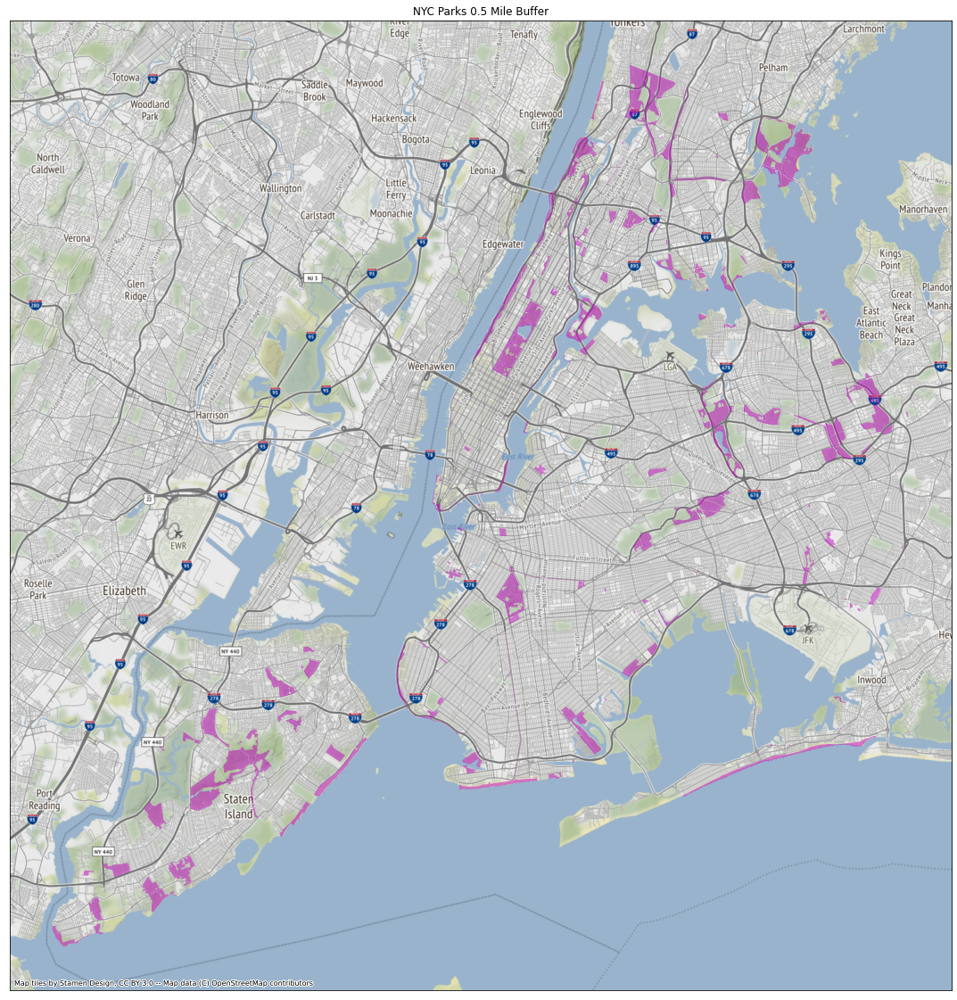

In [38]:
import contextily as ctx
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(20,20))
# Plot the data. ax=ax means we plot it on the axes that we just created
parkgdf.to_crs('EPSG:3857').plot(color='m', alpha=0.5, ax=ax)


# Let's add a basemap using the contextily library
# Note that we add it to the same axes object. 
# The zoom level is trial and error
ctx.add_basemap(ax, zoom=12)

# and we really don't need the axis ticks and labels, so we set them to an empty list
ax.set_xticks([])
ax.set_yticks([])
plt.title("NYC Parks 0.5 Mile Buffer")

In [39]:
parkgdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 908 entries, 0 to 907
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   propname         908 non-null    object  
 1   retireddate      0 non-null      object  
 2   zipcode          908 non-null    object  
 3   acres            902 non-null    object  
 4   location         908 non-null    object  
 5   nys_assembly     906 non-null    object  
 6   councildistrict  908 non-null    object  
 7   description      908 non-null    object  
 8   us_congress      906 non-null    object  
 9   gispropnum       904 non-null    object  
 10  retired          908 non-null    bool    
 11  communityboard   907 non-null    object  
 12  department       908 non-null    object  
 13  subcategory      906 non-null    object  
 14  precinct         908 non-null    object  
 15  omppropid        908 non-null    object  
 16  sitename         908 non-null    obj

In [40]:
#one to many join 
# parkgdf['new_column'] = 0
# parkgdf_new = parkgdf.dissolve(by='new_column')
# parkgdf_new

Text(0.5, 1.0, 'NYC Parks 1 Block Buffer')

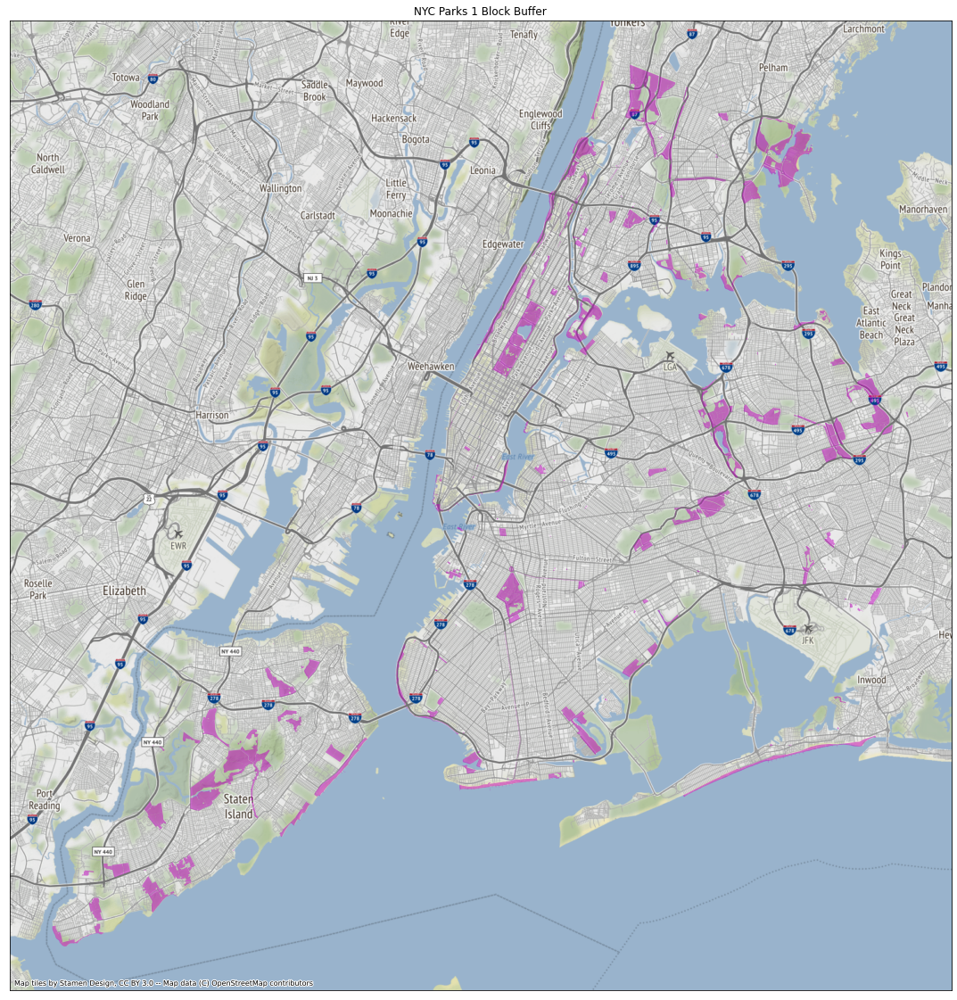

In [41]:
fig, ax = plt.subplots(figsize=(20,20))
parkgdf.to_crs('EPSG:3857').plot(color='m', alpha=0.5, ax=ax) 

ctx.add_basemap(ax, zoom=12)

ax.set_xticks([])
ax.set_yticks([])
plt.title("NYC Parks 1 Block Buffer")

Text(0.5, 1.0, 'NYC Parks 1 Block Buffer')

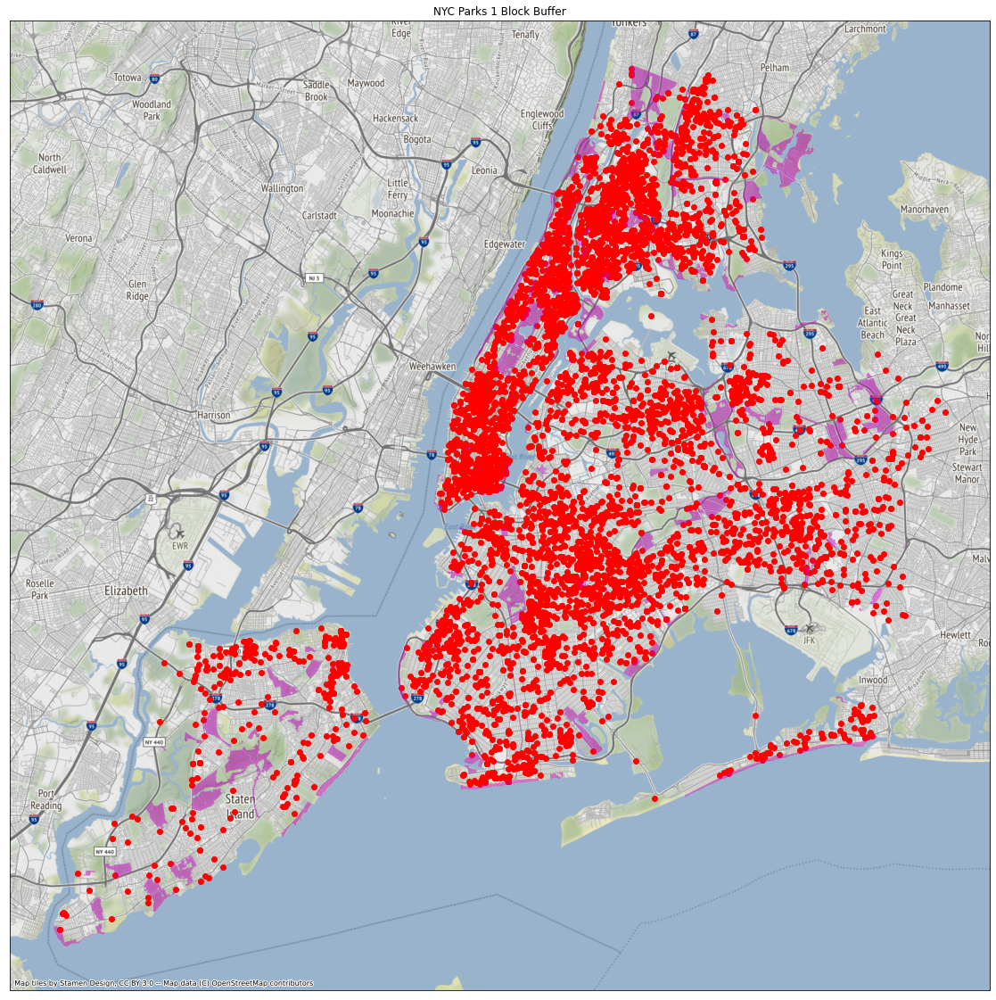

In [47]:
fig, ax = plt.subplots(figsize=(20,20))
arrests.head(10000).to_crs('EPSG:3857').plot(color='r', ax=ax) 
parkgdf.to_crs('EPSG:3857').plot(color='m', alpha=0.5, ax=ax)


ctx.add_basemap(ax, zoom=12)

ax.set_xticks([])
ax.set_yticks([])
plt.title("NYC Parks 1 Block Buffer")

Trying [this method](https://gis.stackexchange.com/questions/271733/geopandas-dissolve-overlapping-polygons) to dissolve my parks polygons (see the last post)

In [43]:
parks_smooth = gpd.GeoDataFrame(
  geometry=[parkgdf.unary_union]).explode(
  index_parts=False).reset_index(
  drop=True)

parks_smooth
parks_smooth = gpd.GeoDataFrame(parks_smooth, geometry='geometry')


In [44]:
parks_smooth.head()

,geometry
0,"POLYGON ((278759.769 36793.647, 278759.510 367..."
1,"POLYGON ((279231.661 37002.447, 279237.895 370..."
2,"POLYGON ((281025.227 38009.039, 280875.882 379..."
3,"POLYGON ((283232.871 38389.640, 283228.637 383..."
4,"POLYGON ((284153.517 39220.376, 284154.291 392..."


ValueError: Cannot transform naive geometries.  Please set a crs on the object first.

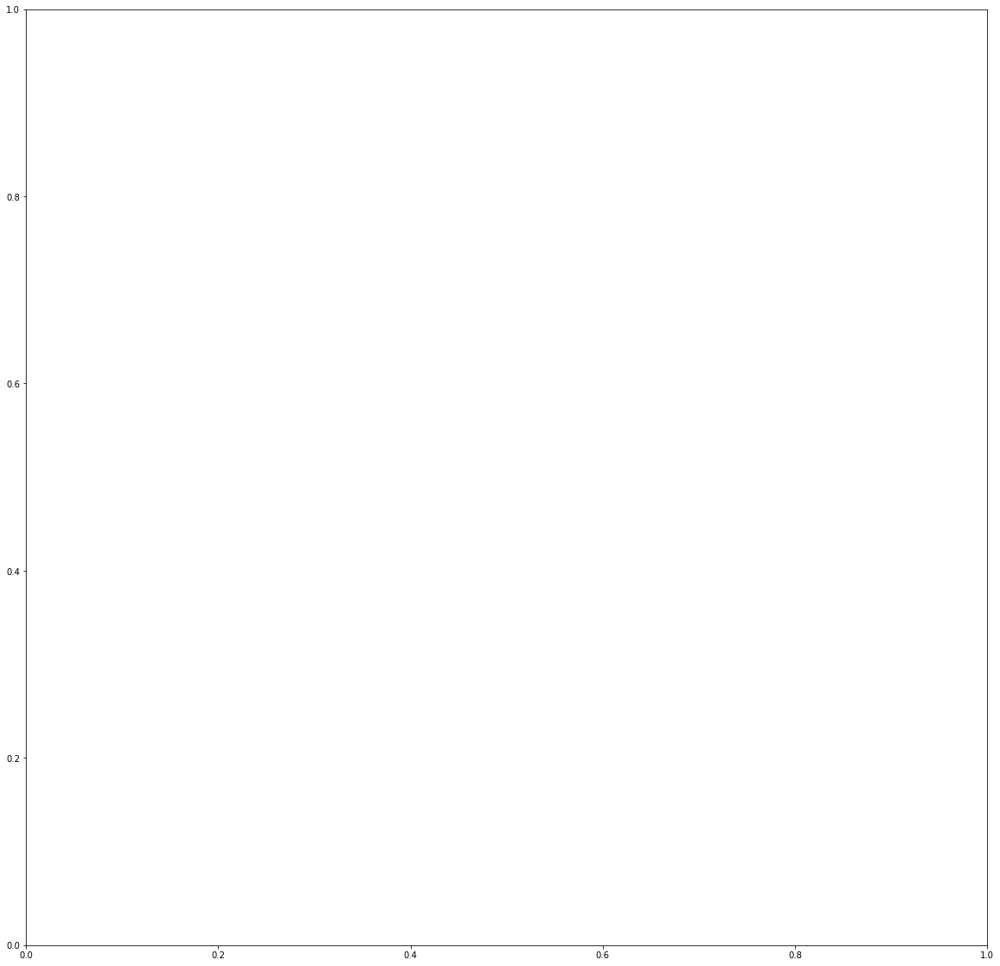

In [45]:
fig, ax = plt.subplots(figsize=(20,20))
parks_smooth.to_crs('EPSG:3857').plot(color='m', alpha=0.5, ax=ax) 

ctx.add_basemap(ax, zoom=12)

ax.set_xticks([])
ax.set_yticks([])
plt.title("NYC Parks 1 Block Buffer")

In [ ]:
parkgdf = parkgdf.to_crs('EPSG:4326')
# next step will be to use the "sjoin_nearest" we learned in lecture to look at the arrests happening near parks. Stay turned!

Adam recommended that I do a nearest spatial join instead of trying to use the buffered parks layer to join the arrests to. So that's what I'm going to move to working on here:

In [ ]:
parkgdf = parkgdf.to_crs('EPSG:3857')
arrests = arrests.to_crs('EPSG:3857')

In [ ]:
parksarrests = arrests.sjoin_nearest(parkgdf, distance_col='dist_to_park')
pd.set_option('display.max_columns', None)
parksarrests

In [ ]:
# convert the parks polygons to centroids 
parksarrests_centroids = parksarrests.copy()
parksarrests_centroids.geometry = parksarrests.geometry.centroid

# map to show the centroids 
fig, ax=plt.subplots(figsize=(10,10))
parksarrests_centroids.plot(ax=ax)
parksarrests.plot(ax=ax, lw=4, alpha=0.5)